In [ ]:
import numpy as np
import tensorflow as tf
import keras
import cv2
from keras.layers import MaxPool2D,Conv2D,UpSampling2D,Input,Dropout
from keras.models import Sequential
from keras.preprocessing.image import img_to_array
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt

In [ ]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 160
color_img = []
path = '../input/landscape-image-colorization/landscape Images/color'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '6000.jpg':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        color_img.append(img_to_array(img))
gray_img = []
path = '../input/landscape-image-colorization/landscape Images/gray'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
     if i == '6000.jpg':
        break
     else: 
        img = cv2.imread(path + '/'+i,1)

        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        gray_img.append(img_to_array(img))

 84%|████████▍ | 6000/7129 [00:29<00:05, 203.48it/s]


In [ ]:
def plot_images(color,grayscale):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
   
    plt.show()

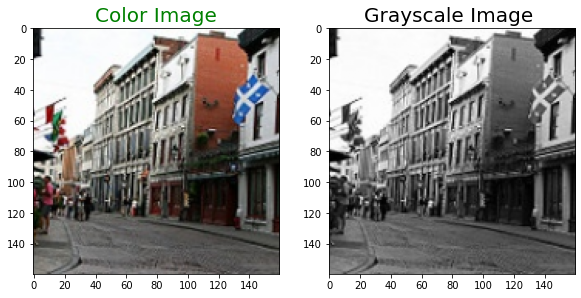

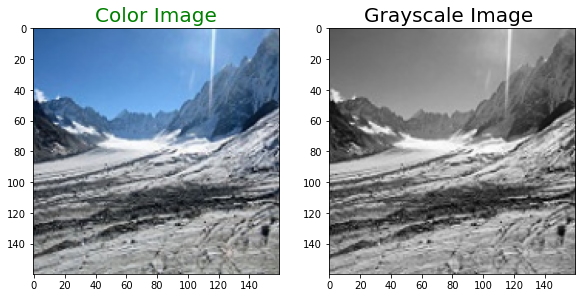

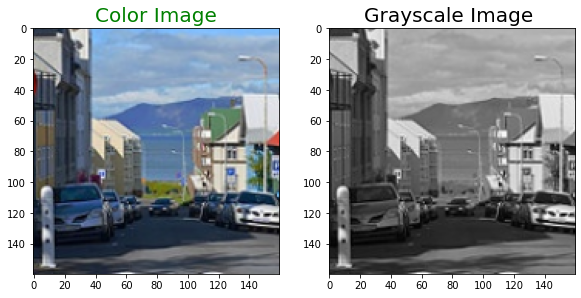

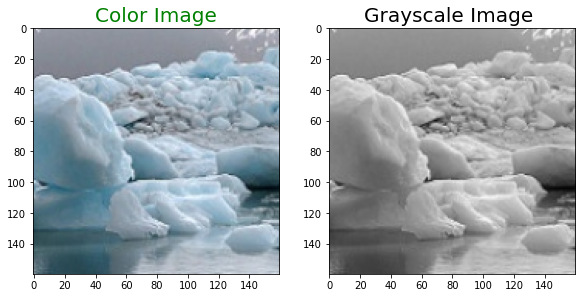

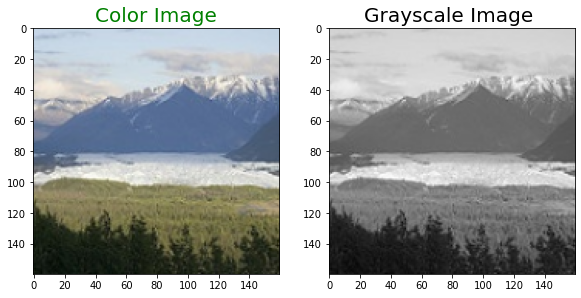

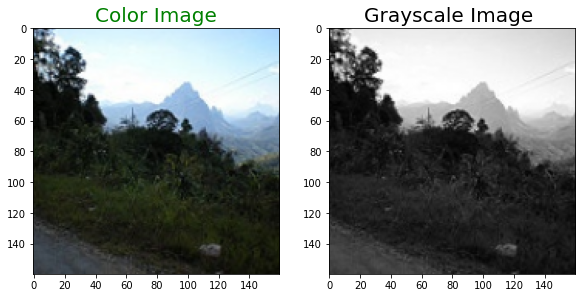

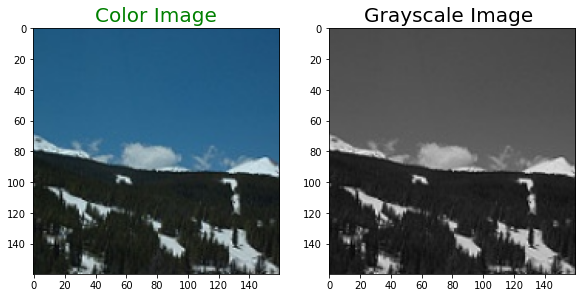

In [ ]:
for i in range(3,10):
     plot_images(color_img[i],gray_img[i])

In [ ]:
train_gray_image = gray_img[:5500]
train_color_image = color_img[:5500]

test_gray_image = gray_img[5500:]
test_color_image = color_img[5500:]
# reshaping
train_g = np.reshape(train_gray_image,(len(train_gray_image),SIZE,SIZE,3))
train_c = np.reshape(train_color_image, (len(train_color_image),SIZE,SIZE,3))
print('Train color image shape:',train_c.shape)


test_gray_image = np.reshape(test_gray_image,(len(test_gray_image),SIZE,SIZE,3))
test_color_image = np.reshape(test_color_image, (len(test_color_image),SIZE,SIZE,3))
print('Test color image shape',test_color_image.shape)

Train color image shape: (5500, 160, 160, 3)
Test color image shape (500, 160, 160, 3)


In [ ]:
from keras import layers
def down(filters , kernel_size, apply_batch_normalization = True):
    downsample = tf.keras.models.Sequential()
    downsample.add(layers.Conv2D(filters,kernel_size,padding = 'same', strides = 2))
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
    downsample.add(keras.layers.LeakyReLU())
    return downsample


def up(filters, kernel_size, dropout = False):
    upsample = tf.keras.models.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size,padding = 'same', strides = 2))
    if dropout:
        upsample.dropout(0.2)
    upsample.add(keras.layers.LeakyReLU())
    return upsample

In [ ]:
def model():
    inputs = layers.Input(shape= [160,160,3])
    d1 = down(128,(3,3),False)(inputs)
    d2 = down(128,(3,3),False)(d1)
    d3 = down(256,(3,3),True)(d2)
    d4 = down(512,(3,3),True)(d3)
    
    d5 = down(512,(3,3),True)(d4)
    #upsampling
    u1 = up(512,(3,3),False)(d5)
    u1 = layers.concatenate([u1,d4])
    u2 = up(256,(3,3),False)(u1)
    u2 = layers.concatenate([u2,d3])
    u3 = up(128,(3,3),False)(u2)
    u3 = layers.concatenate([u3,d2])
    u4 = up(128,(3,3),False)(u3)
    u4 = layers.concatenate([u4,d1])
    u5 = up(3,(3,3),False)(u4)
    u5 = layers.concatenate([u5,inputs])
    output = layers.Conv2D(3,(2,2),strides = 1, padding = 'same')(u5)
    return tf.keras.Model(inputs=inputs, outputs=output)

In [ ]:
model = model()
model.summary()

2022-12-14 04:31:12.953082: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 04:31:13.046846: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 04:31:13.047619: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 04:31:13.049547: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 160, 160, 3) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 80, 80, 128)  3584        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, 40, 40, 128)  147584      sequential[0][0]                 
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, 20, 20, 256)  296192      sequential_1[0][0]               
______________________________________________________________________________________________

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error',
              metrics = ['acc'])

model.fit(train_g, train_c, epochs = 50,batch_size = 50,verbose = 1)

2022-12-14 04:31:16.101674: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1689600000 exceeds 10% of free system memory.
2022-12-14 04:31:18.365384: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1689600000 exceeds 10% of free system memory.
2022-12-14 04:31:20.287975: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1689600000 exceeds 10% of free system memory.
2022-12-14 04:31:21.720549: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1689600000 exceeds 10% of free system memory.
2022-12-14 04:31:23.212335: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/50


2022-12-14 04:31:25.094076: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


110/110 [==============================] - 24s 138ms/step - loss: 0.0957 - acc: 0.3922
Epoch 2/50
110/110 [==============================] - 15s 138ms/step - loss: 0.0663 - acc: 0.4608
Epoch 3/50
110/110 [==============================] - 15s 137ms/step - loss: 0.0588 - acc: 0.4809
Epoch 4/50
110/110 [==============================] - 15s 138ms/step - loss: 0.0541 - acc: 0.4885
Epoch 5/50
110/110 [==============================] - 15s 137ms/step - loss: 0.0514 - acc: 0.4978
Epoch 6/50
110/110 [==============================] - 15s 138ms/step - loss: 0.0498 - acc: 0.5049
Epoch 7/50
110/110 [==============================] - 15s 137ms/step - loss: 0.0486 - acc: 0.5125
Epoch 8/50
110/110 [==============================] - 15s 139ms/step - loss: 0.0481 - acc: 0.5162
Epoch 9/50
110/110 [==============================] - 15s 137ms/step - loss: 0.0475 - acc: 0.5244
Epoch 10/50
110/110 [==============================] - 15s 138ms/step - loss: 0.0466 - acc: 0.5320
Epoch 11/50
110/110 [=========

In [ ]:
model.evaluate(test_gray_image,test_color_image)

2022-12-14 04:44:47.160182: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 153600000 exceeds 10% of free system memory.


16/16 [==============================] - 1s 49ms/step - loss: 0.0489 - acc: 0.5332


[0.04891306906938553, 0.5332273244857788]

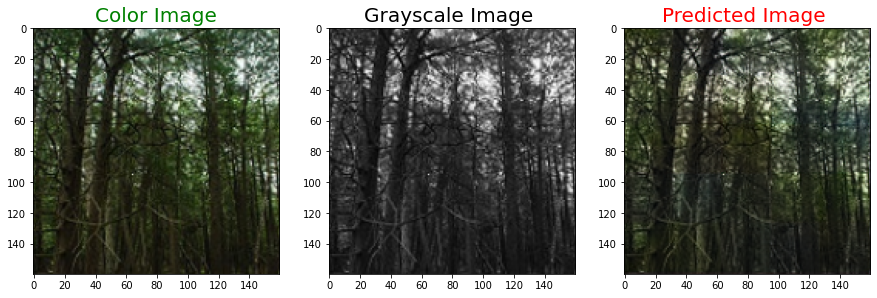

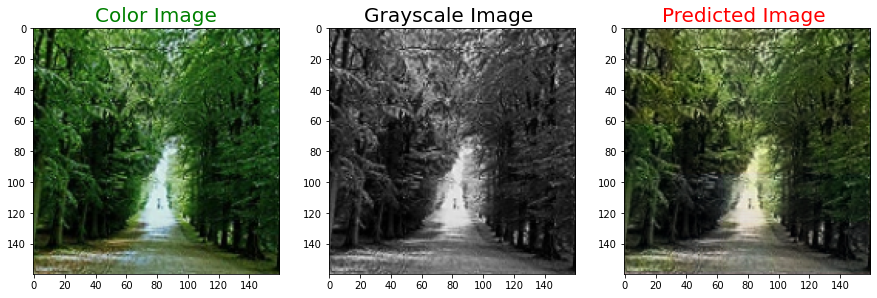

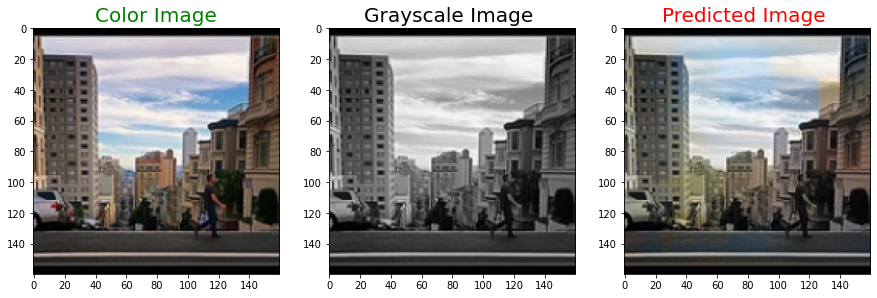

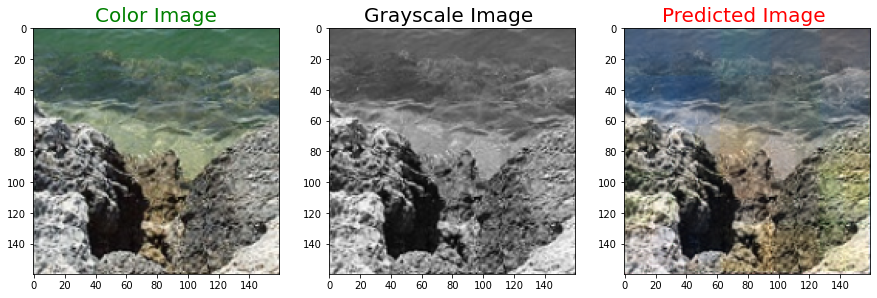

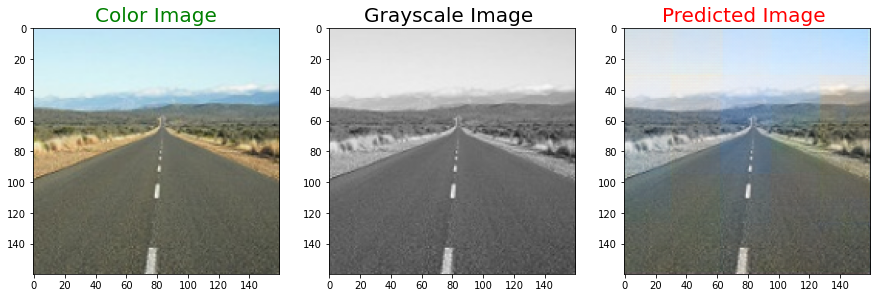

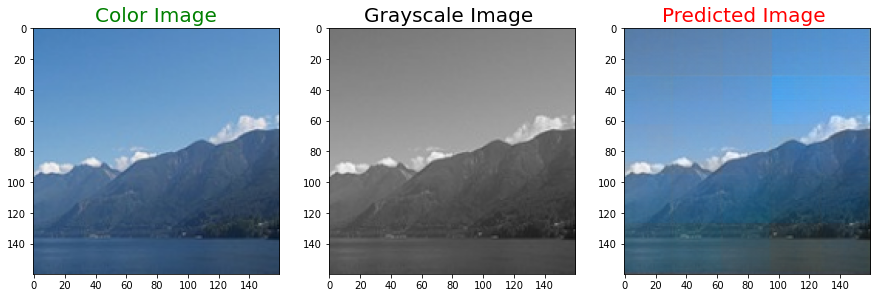

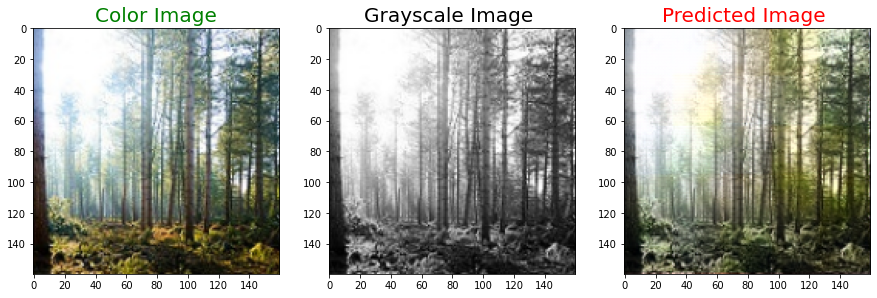

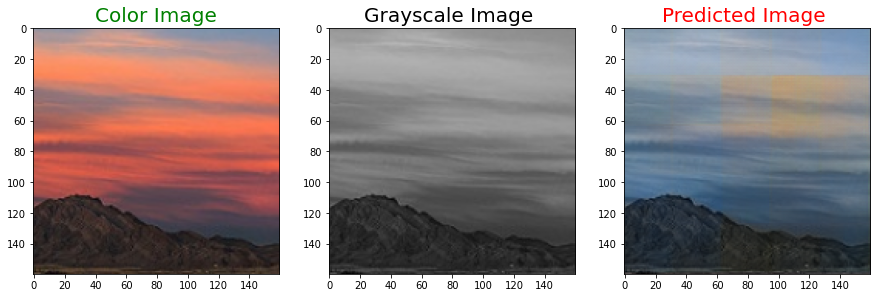

In [ ]:
def plot_images(color,grayscale,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(50,58):
    predicted = np.clip(model.predict(test_gray_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_color_image[i],test_gray_image[i],predicted)

In [ ]:
SIZE = 160
color_img_blur = []
path = '../input/landscape-image-colorization/landscape Images/color'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):    
    if i == '6000.jpg':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.blur(img,(5,5))
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        color_img_blur.append(img_to_array(img))
gray_img_blur = []
path = '../input/landscape-image-colorization/landscape Images/gray'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
     if i == '6000.jpg':
        break
     else: 
        img = cv2.imread(path + '/'+i,1)
        img = cv2.blur(img,(5,5))
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        gray_img_blur.append(img_to_array(img))

 84%|████████▍ | 6000/7129 [00:34<00:06, 176.17it/s]


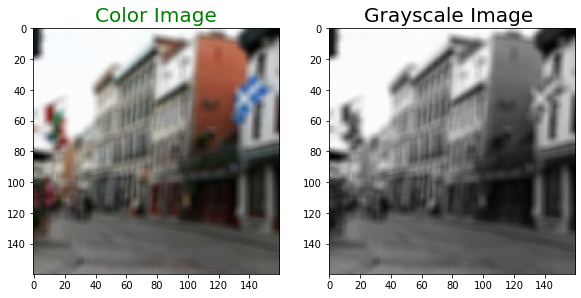

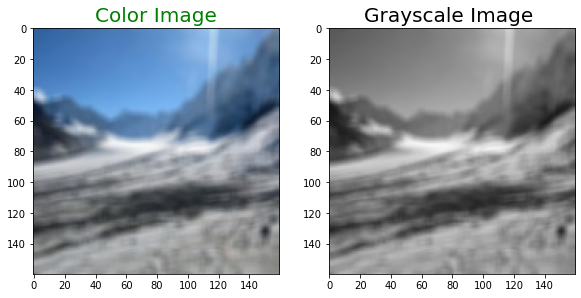

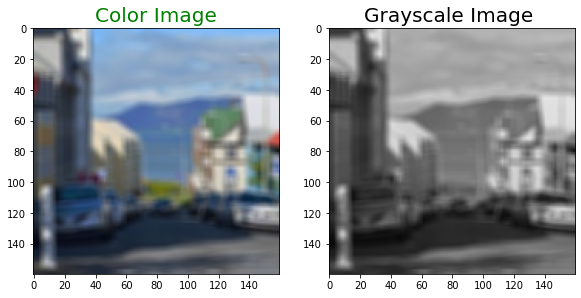

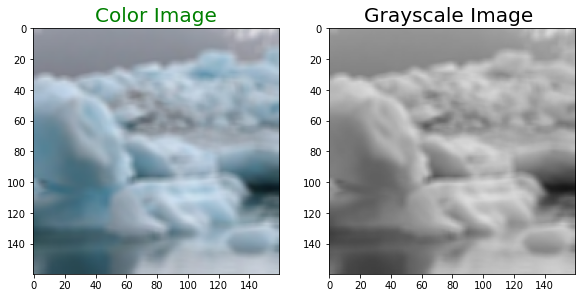

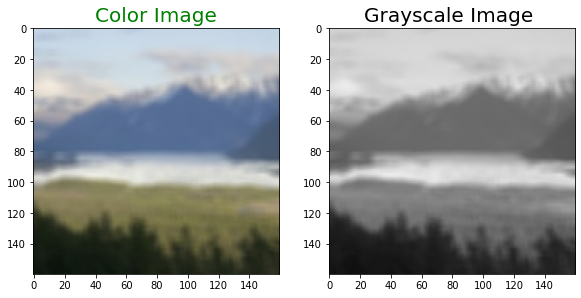

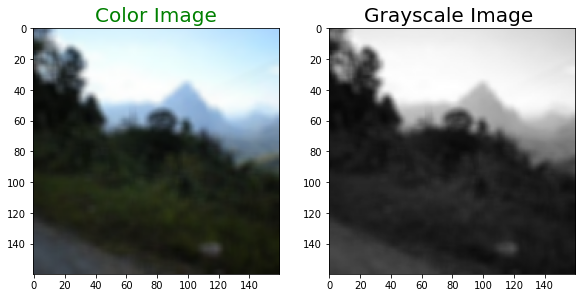

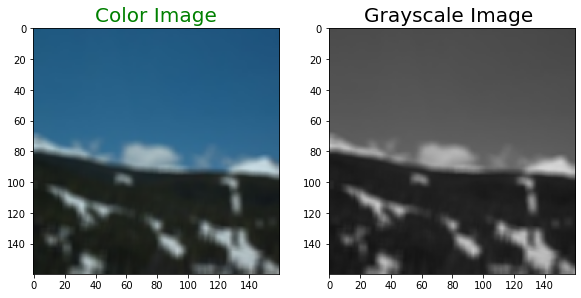

In [ ]:
def plot_images(color,grayscale):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
   
    plt.show()
for i in range(3,10):
     plot_images(color_img_blur[i],gray_img_blur[i])

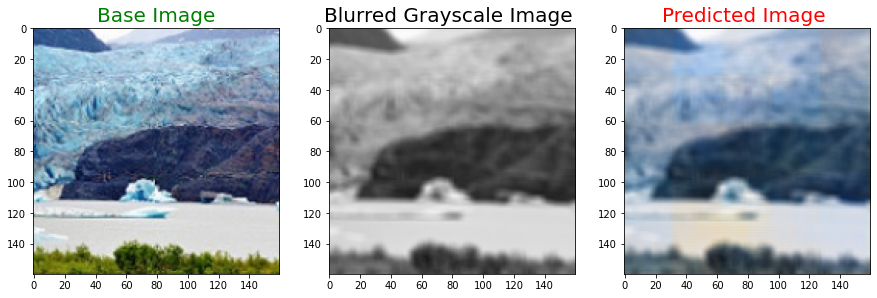

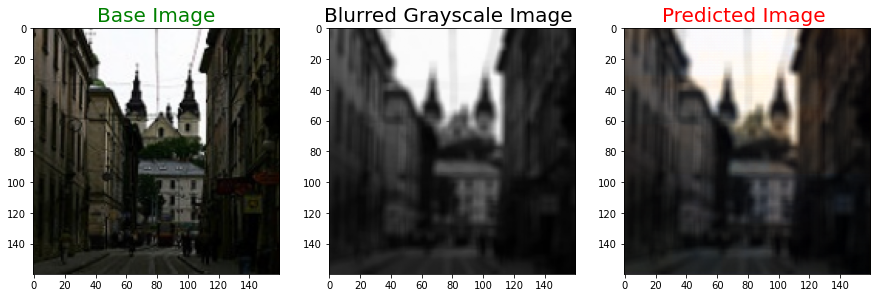

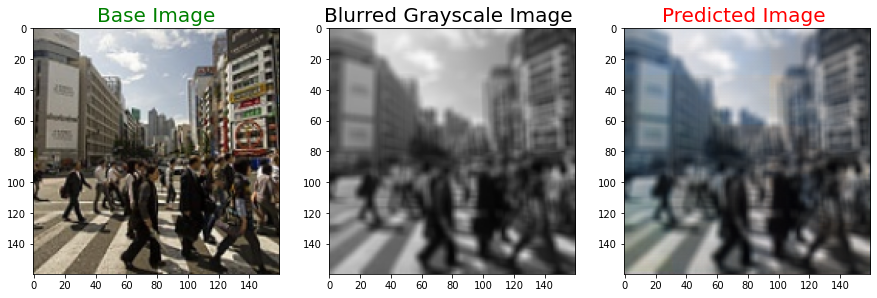

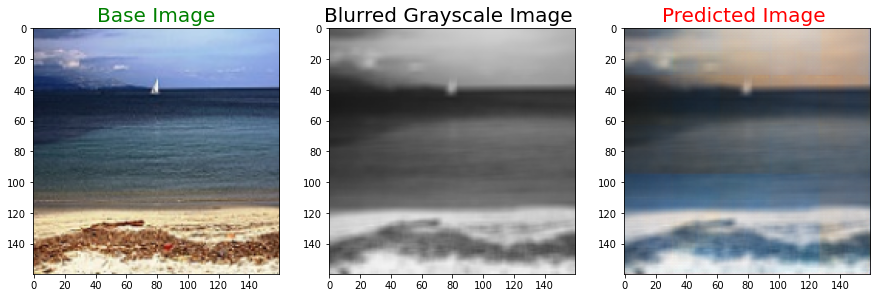

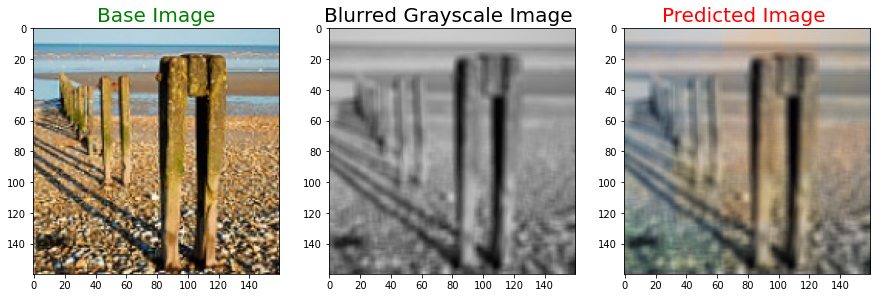

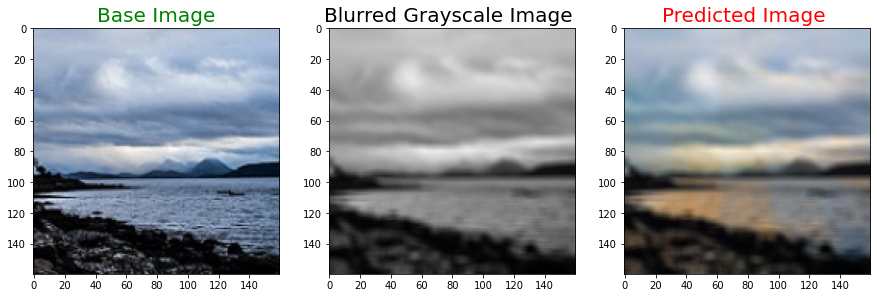

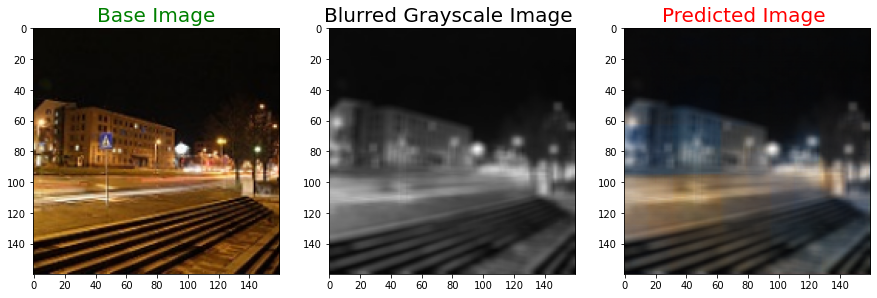

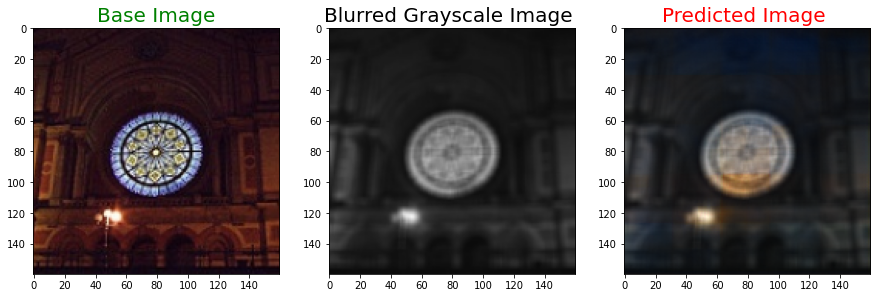

In [ ]:
def plot_images(color,grayscale,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Base Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Blurred Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

for i in range(50,58):
    predicted = np.clip(model.predict(gray_img_blur[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(color_img[i],gray_img_blur[i],predicted)

In [ ]:
noised = []
path = '/kaggle/input/noised'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
        img = cv2.imread(path + '/'+i,1)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        noised.append(img_to_array(img))

100%|██████████| 3/3 [00:00<00:00, 195.18it/s]


**Noised Image Test**

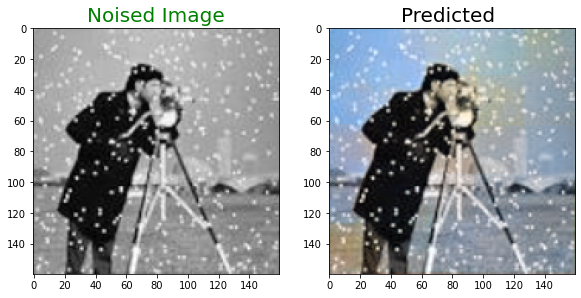

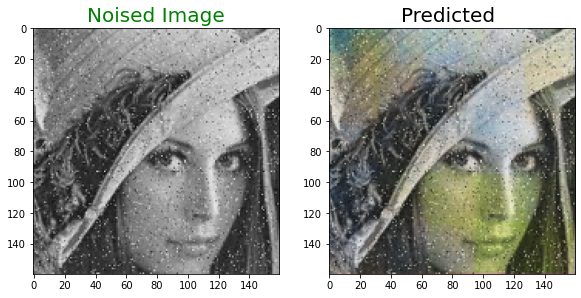

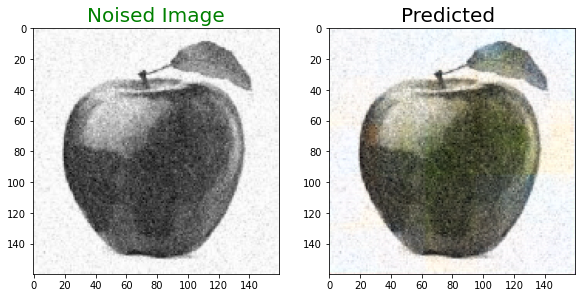

In [ ]:
def plot_images(noised,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Noised Image', color = 'green', fontsize = 20)
    plt.imshow(noised)
    plt.subplot(1,3,2)
    plt.title('Predicted ', color = 'black', fontsize = 20)
    plt.imshow(predicted)
    plt.show()
for i in range(0,3):
    predicted = np.clip(model.predict(noised[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(noised[i],predicted)

**New Landscape Image Different Dataset**

In [ ]:
SIZE = 160
new_color = []
path = '/kaggle/input/akulelah/Landscape2'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):       
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        new_color.append(img_to_array(img))
new_gray = []
path = '/kaggle/input/akulelah/Landscape2'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        new_gray.append(img_to_array(img))

100%|██████████| 3/3 [00:00<00:00, 333.74it/s]


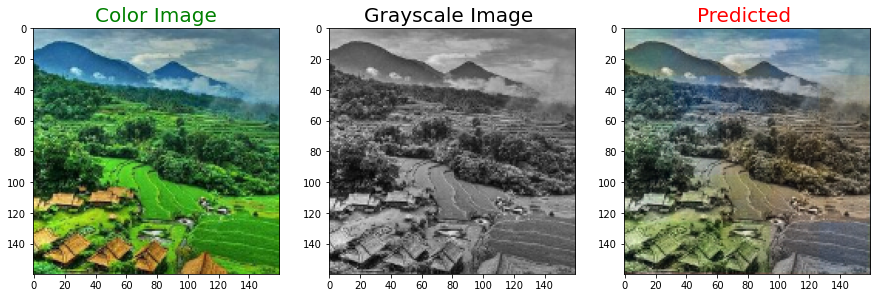

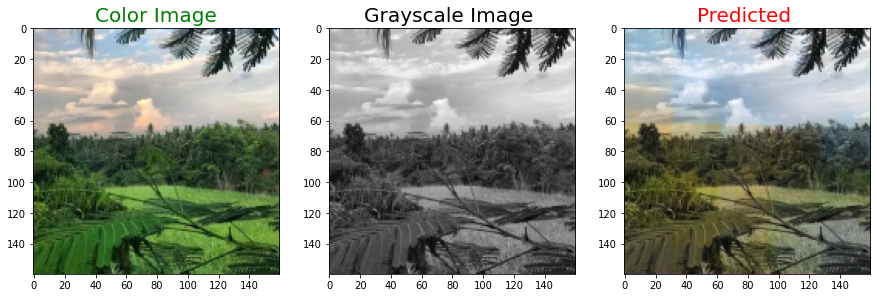

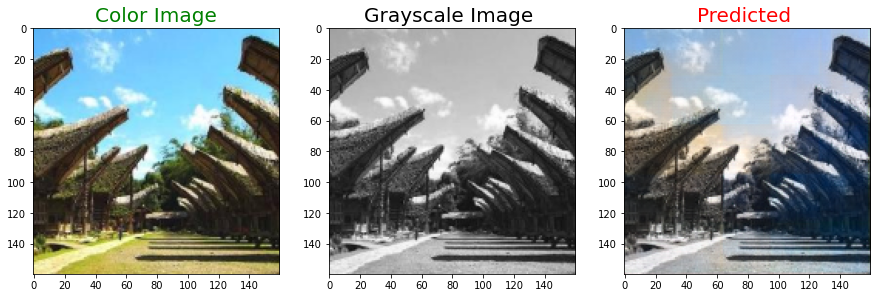

In [ ]:
def plot_images(color,grayscale,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale,cmap='gray')
    plt.subplot(1,3,3)
    plt.title('Predicted ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()
for i in range(0,3):
     predicted = np.clip(model.predict(new_gray[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
     plot_images(new_color[i],new_gray[i],predicted)

In [ ]:
SIZE = 160
new_color_reflect = []
path = '/kaggle/input/akulelah/Landscape2'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):       
        img = cv2.imread(path + '/'+i,1)
        # open cv reads images in BGR format so we have to convert it to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #rotate image
        rows, cols, dim = img.shape 
        M_reflect = np.float32([
            [1,0,0],
            [0,-1,rows],
            [0,0,1],
        ])
        img = cv2.warpPerspective(img, M_reflect, (int(cols), int(rows)))
#         img = cv2.warpPerspective(img, M_reflect_x, (int(cols), int(rows)))
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        new_color_reflect.append(img_to_array(img))
new_gray_reflect = []
path = '/kaggle/input/akulelah/Landscape2'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #rotate image
        rows, cols, dim = img.shape 
        M_reflect = np.float32([
            [1,0,0],
            [0,-1,rows],
            [0,0,1],
        ])
        img = cv2.warpPerspective(img, M_reflect, (int(cols), int(rows)))
#         img = cv2.warpPerspective(img, M_reflect_x, (int(cols), int(rows)))
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        new_gray_reflect.append(img_to_array(img))

100%|██████████| 3/3 [00:00<00:00, 335.56it/s]


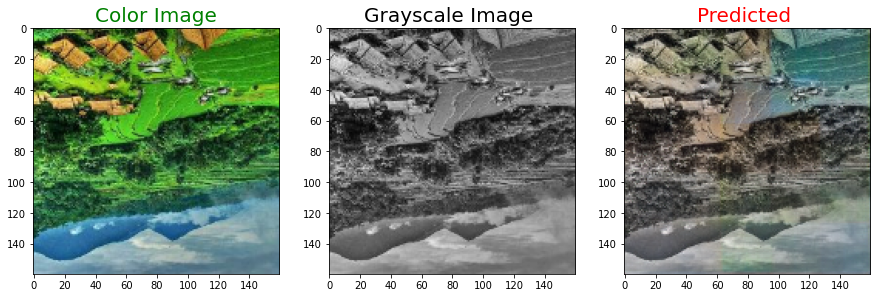

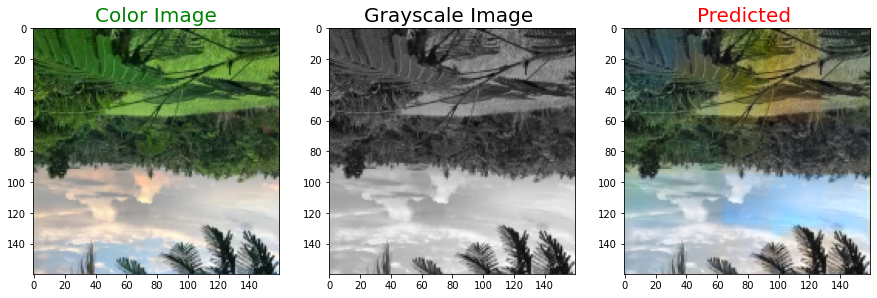

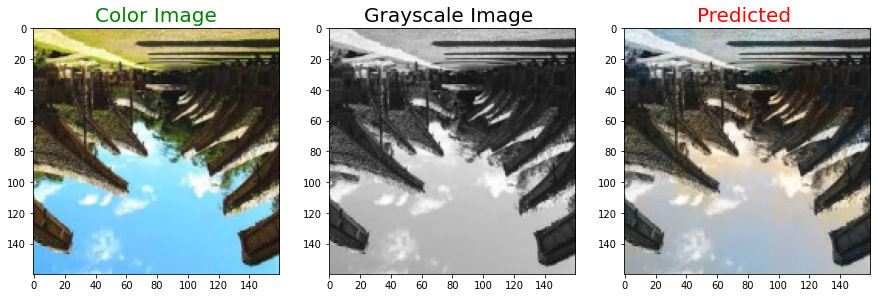

In [ ]:
def plot_images(color,grayscale,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale,cmap='gray')
    plt.subplot(1,3,3)
    plt.title('Predicted ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()
for i in range(0,3):
     predicted = np.clip(model.predict(new_gray_reflect[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
     plot_images(new_color_reflect[i],new_gray_reflect[i],predicted)

In [ ]:
SIZE = 160
new_gray_noise2 = []
path = '/kaggle/input/newnoised/noised2'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        new_gray_noise2.append(img_to_array(img))

100%|██████████| 4/4 [00:00<00:00, 84.52it/s]


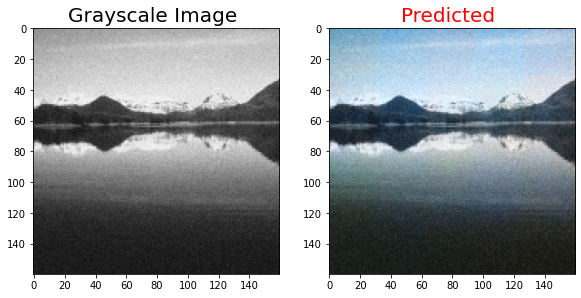

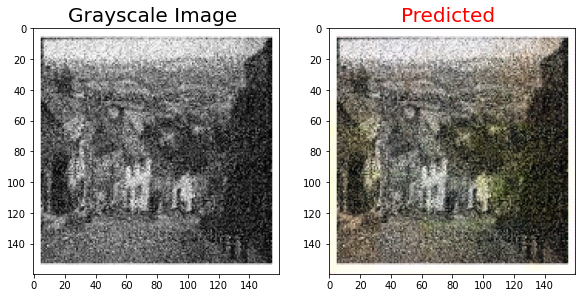

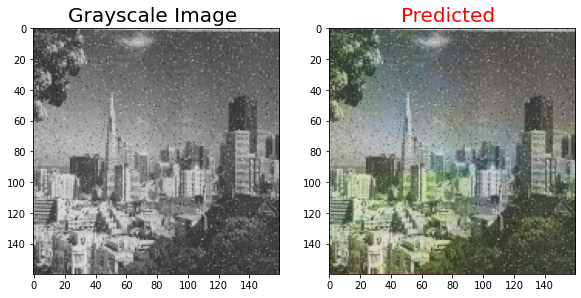

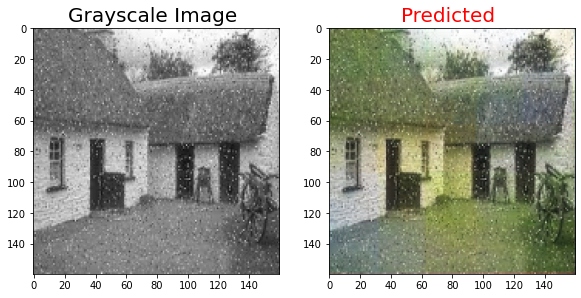

In [ ]:
def plot_images(grayscale,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale,cmap='gray')
    plt.subplot(1,3,2)
    plt.title('Predicted ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()
for i in range(0,4):
     predicted = np.clip(model.predict(new_gray_noise2[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
     plot_images(new_gray_noise2[i],predicted)